In [1]:
import pandas as pd 
import numpy as np
import time
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt 

df = pd.read_csv("../../Tascas/Data/DelayedFlights.csv", nrows=1e5)
newdf = df[["AirTime","DepDelay"]].dropna()

In [10]:
newdf = df[["AirTime","Distance","TaxiOut", "ArrDelay","DepDelay"]].dropna()

In [11]:
kmeans = KMeans(n_clusters=4, random_state=0, n_jobs=-1).fit(newdf)
kmeans.labels_

/home/jesus/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:938: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


array([3, 3, 0, ..., 3, 3, 3], dtype=int32)

In [12]:
# distribucion individuos en cada grupo
np.unique(kmeans.labels_,return_counts=True)

(array([0, 1, 2, 3], dtype=int32), array([51397,  9831,  4776, 33686]))

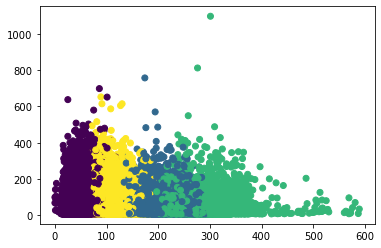

In [13]:
# distribucion centroides

plt.scatter(newdf["AirTime"], newdf["DepDelay"], c = kmeans.labels_)
plt.show()

In [6]:
kmeans.cluster_centers_

array([[ 84.17155105, 153.14941825],
       [254.03107593,  37.53014756],
       [ 59.92327996,  29.03462397],
       [129.05894117,  28.57001623]])

In [7]:
alldf = pd.read_csv("../../Tascas/Data/DelayedFlights.csv", nrows=1e6)[["AirTime","DepDelay"]].dropna()

In [8]:
kmeans.predict(alldf)[0:50]  #clasificacion de los primeros 50

array([3, 3, 2, 2, 2, 1, 3, 0, 2, 1, 1, 3, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 2, 2, 3, 2, 2, 2, 2, 2, 3, 3,
       3, 3, 2, 2, 2, 2], dtype=int32)